# Trash Image Classification

Project is aimed to classifiy trash images into 6 categories cardboard, glass, metal, paper, plastic, trash.  
The dataset was collected from here https://github.com/garythung/trashnet 

## Imports 

In [16]:
# General
import os  # utilties 
import matplotlib.pyplot as plt # plotting
import seaborn as sns #plotting
import numpy as np # vectors, math operation
import pandas as pd # dataframes , data manipluation
import keras # machine learning framework

#POST PROCESSING
from keras.preprocessing.image import ImageDataGenerator, load_img , img_to_array
from sklearn.model_selection import StratifiedShuffleSplit

# MODEL CREATION
from keras.models import Sequential
from keras.layers import Dense, Conv2D , MaxPool2D , Flatten , Dropout
from sklearn.metrics import classification_report,confusion_matrix
from keras.callbacks import ModelCheckpoint

# INTERNAL IMPORTS
from modules import utils

%matplotlib inline
plt.style.use('seaborn')

## Reading Data

#### parameters

In [33]:
folder_dir = '.\\dataset-original\\'

getting all files paths in folders and put them in dataFrame table

In [34]:
data_df = pd.DataFrame(columns=['FilePath','Class'])
# GETTING ALL DIRECTORIES
class_dirs = utils.get_directories(directory=folder_dir) # directories==folders
# FOR EACH DIRECTORY GET ALL FILES PATHS
for class_dir in class_dirs:
    # get files paths
    class_files = utils.get_files(extension='jpg',path=class_dir)
    # get the class name
    class_name = class_dir.split(os.sep)[-2]
    # data in shape [[path,class], [path,class]]
    class_data = [[file_path, class_name] for file_path in class_files]
    temp_df = pd.DataFrame(data=class_data, columns=['FilePath','Class'])
    data_df = data_df.append(temp_df, ignore_index=True)
data_df

,FilePath,Class
0,.\dataset-original\cardboard\cardboard1.jpg,cardboard
1,.\dataset-original\cardboard\cardboard10.jpg,cardboard
2,.\dataset-original\cardboard\cardboard100.jpg,cardboard
3,.\dataset-original\cardboard\cardboard101.jpg,cardboard
4,.\dataset-original\cardboard\cardboard102.jpg,cardboard
...,...,...
2522,.\dataset-original\trash\trash95.jpg,trash
2523,.\dataset-original\trash\trash96.jpg,trash
2524,.\dataset-original\trash\trash97.jpg,trash
2525,.\dataset-original\trash\trash98.jpg,trash


#### Exploring Data

Number of samples= 2527   Number of classes= 6


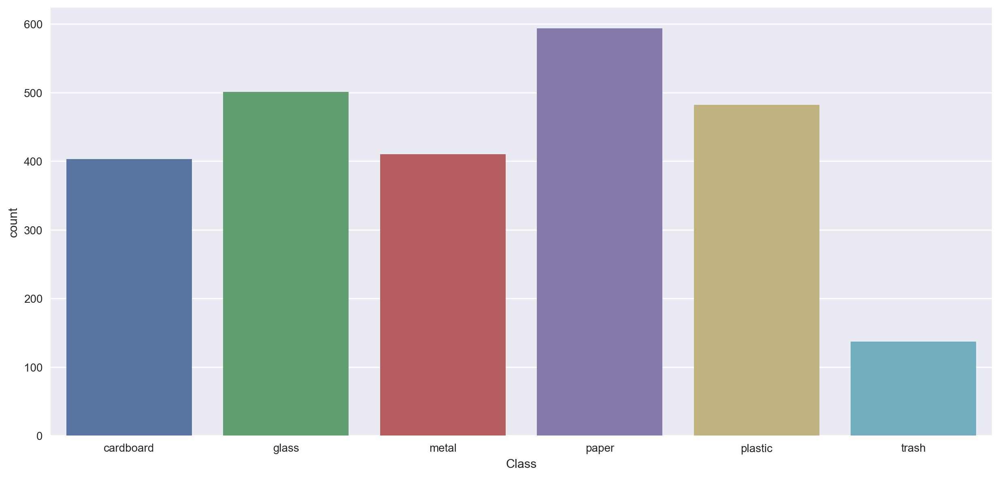

In [35]:
print("Number of samples=", data_df.shape[0], "  Number of classes=", len(data_df['Class'].unique()))
fig, ax = plt.subplots(figsize=(15, 7), dpi=200)
sns.countplot(data=data_df, x='Class',ax=ax);

we can see the data is not balanced(not an equal distribution)  
we can also pick some random images and visualize it, find it's shapes.

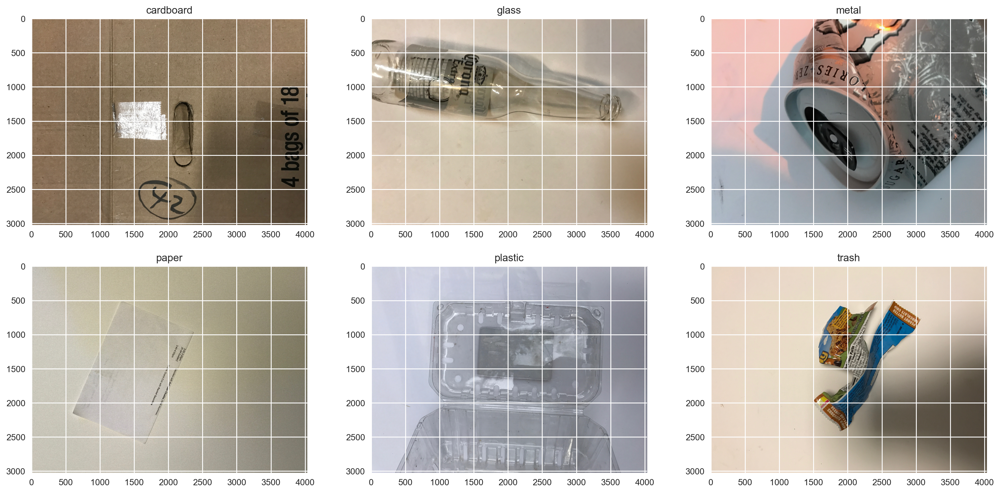

In [36]:
classes = data_df['Class'].unique()
plt.figure(figsize=(20,15), dpi=200)
columns = 3
for idx, one_class in enumerate(classes):
    # filter for class
    class_df = data_df[data_df['Class']==one_class]
    # pick random sample
    sample_file_path = class_df.sample(n=1)['FilePath'].item()
    # READ IMAGE
    sample_image = load_img(path=sample_file_path)
    # Display image
    plt.subplot(len(classes) / columns + 1, columns, idx + 1)
    plt.imshow(sample_image)
    plt.title(one_class)

we can find images have different shapes and large too (2000,3000).  
so we will need to resize them in a sutiable dimension to be able to feed them to the model.

## Cleaning Data

#### Parameters

In [6]:
test_size = 0.2

#### Splitting data

total Number of training data set : 2021
total Number of testing data set : 506


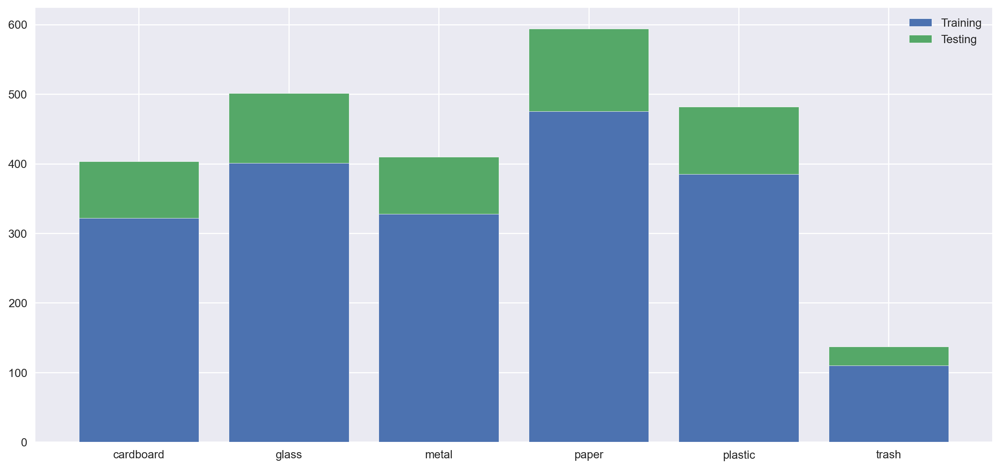

In [38]:
#SPLITTING DATA
X = data_df['FilePath']
y = data_df['Class']
spliter = StratifiedShuffleSplit(n_splits=1, test_size=test_size, random_state=0)
splitted = spliter.split(X,y)
# THESE lines determine which rows I should take from the main dataframe
for train_index, test_index in splitted:
    X_train, X_test = X.to_numpy()[train_index], X.to_numpy()[test_index]
    y_train, y_test = y.to_numpy()[train_index], y.to_numpy()[test_index]
# creating training dataframe
train_df = pd.DataFrame(columns=['FilePath','Class'],data={'FilePath':X_train ,'Class':y_train})  
# creating test datafrane
test_df = pd.DataFrame(columns=['FilePath','Class'],data={'FilePath':X_test ,'Class':y_test})  
# Prepare data for plotting
classes = data_df['Class'].unique().tolist()
no_of_classes_list = [i for i in range(len(classes))]
y_train_count = [np.count_nonzero(y_train==one_class) for one_class in classes]
y_test_count = [np.count_nonzero(y_test==one_class) for one_class in classes]

#plotting
fig, ax = plt.subplots(figsize=(15,7), dpi=200)
ax.bar(no_of_classes_list, y_train_count, edgecolor='white', label='Training')
ax.bar(no_of_classes_list, y_test_count,bottom=y_train_count, edgecolor='white', label='Testing')
leg = ax.legend();
plt.xticks(no_of_classes_list, classes);
print(f'total Number of training data set : {len(train_df)}')
print(f'total Number of testing data set : {len(test_df)}')

#### Data Resizing and Augmentation

as we mentioned before we will need to resize the image before being able to feed to the model 
  
In order to make the most of our few training examples, we will "augment" them via a number of random transformations,  
so that our model would never see twice the exact same picture. This helps prevent overfitting and helps the model generalize better.

In [8]:
target_image_size = (300, 300)  # (width, height)
batch_size = 32
train_df

,FilePath,Class
0,.\dataset-original\plastic\plastic183.jpg,plastic
1,.\dataset-original\cardboard\cardboard182.jpg,cardboard
2,.\dataset-original\paper\paper491.jpg,paper
3,.\dataset-original\metal\metal274.jpg,metal
4,.\dataset-original\glass\glass113.jpg,glass
...,...,...
2016,.\dataset-original\paper\paper363.jpg,paper
2017,.\dataset-original\paper\paper89.jpg,paper
2018,.\dataset-original\plastic\plastic365.jpg,plastic
2019,.\dataset-original\glass\glass335.jpg,glass


Found 2021 validated image filenames belonging to 6 classes.


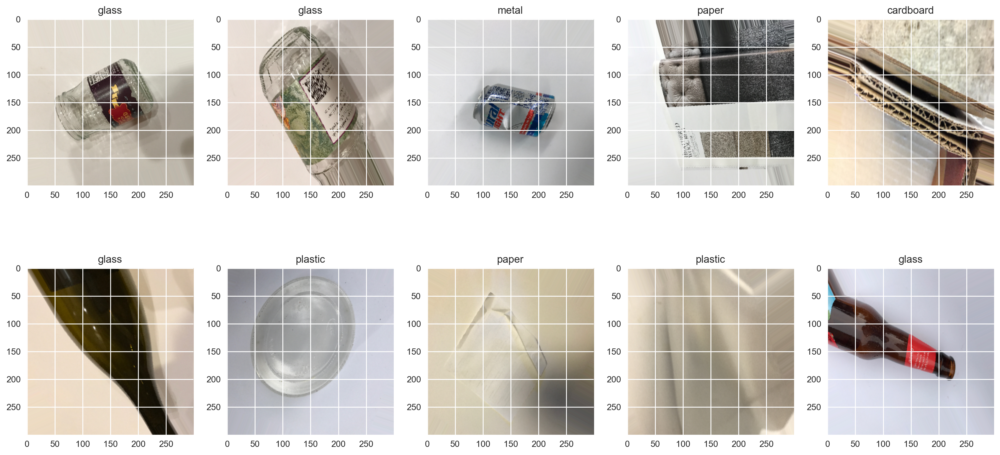

In [12]:
#### SHOWING SAMPLE OF IMAGE GENERATOR
datagen = ImageDataGenerator(
            #rescale=1./255, # rescalle rgp values from 0,255 to 0,1 FOR TRAINING ONLY
            shear_range=0.2, # randomly make a shear effect
            rotation_range = 30,  # randomly rotate images in the range (degrees, 0 to 180)
            zoom_range = 0.2, # Randomly zoom image 
            width_shift_range=0.1,  # randomly shift images horizontally (fraction of total width)
            height_shift_range=0.1,  # randomly shift images vertically (fraction of total height)
            horizontal_flip=True) # randomly flip images

# we creating an image generator it will do the following
# one hot encoing on CLASS COl [0 1 0 0 0]...
# READ IMAGE files and convert it to array for feedint it to the network
# 
generator = datagen.flow_from_dataframe(dataframe=train_df,
                                        x_col="FilePath",
                                        y_col="Class",
                                        target_size=target_image_size,
                                        batch_size=10,
                                        class_mode="categorical", # 
                                        seed=None) # CHANGE TO INTEGER TO PREVENT RANDOMNESS
# PLOTTING SAMPLES
## SEE SOME AUGMENTAION SAMPLES FROM
# GET ONE BATCH OF 16(BATCH SIZE) IMAGE
batch = generator.next()
images, labels = batch
plt.figure(figsize=(20,15), dpi=200)
columns = 5
for idx, image in enumerate(images):
    image = image.astype('uint8')
    # GET INDEX OF 1
    itemindex = np.where(labels[idx]==1)[0][0]
    # GET THE LABEL
    label = classes[itemindex]
    plt.subplot(len(images) / columns + 1, columns, idx + 1)
    plt.imshow(image)
    plt.title(label)

In [26]:
#MAKE THE ACT
train_datagen = ImageDataGenerator(
            rescale=1./255, # rescalle rgp values from 0,255 to 0,1 FOR TRAINING ONLY
            shear_range=0.2, # randomly make a shear effect
            rotation_range = 30,  # randomly rotate images in the range (degrees, 0 to 180)
            zoom_range = 0.2, # Randomly zoom image 
            width_shift_range=0.1,  # randomly shift images horizontally (fraction of total width)
            height_shift_range=0.1,  # randomly shift images vertically (fraction of total height)
            horizontal_flip=True) # randomly flip images

# we creating an image generator it will do the following
# one hot encoing on CLASS COl [0 1 0 0 0]...
# READ IMAGE files and convert it to array for feedint it to the network
# 
train_generator = train_datagen.flow_from_dataframe(dataframe=train_df,
                                                    x_col="FilePath",
                                                    y_col="Class",
                                                    target_size=target_image_size,
                                                    batch_size=batch_size,
                                                    class_mode="categorical", # 
                                                    seed=None) # CHANGE TO INTEGER TO PREVENT RANDOMNESS

test_datagen = ImageDataGenerator(rescale=1./255) # rescalle rgp values from 0,255 to 0,1 FOR TRAINING ONLY

# we creating an image generator it will do the following
# one hot encoing on CLASS COl [0 1 0 0 0]...
# READ IMAGE files and convert it to array for feedint it to the network
# 
test_generator = test_datagen.flow_from_dataframe(dataframe=test_df,
                                                    x_col="FilePath",
                                                    y_col="Class",
                                                    target_size=target_image_size,
                                                    batch_size=batch_size,
                                                    class_mode="categorical", # 
                                                    shuffle=False,
                                                    seed=None) # CHANGE TO INTEGER TO PREVENT RANDOMNESS

Found 2021 validated image filenames belonging to 6 classes.
Found 506 validated image filenames belonging to 6 classes.


## Creating Model

### Simple Model

In [27]:
model = Sequential()
model.add(Conv2D(32,3, padding="same", activation="relu", input_shape=(target_image_size[0], target_image_size[1], 3)))
model.add(MaxPool2D(pool_size=(2, 2)))

model.add(Conv2D(32, 3, padding="same", activation="relu"))
model.add(MaxPool2D(pool_size=(2, 2)))

model.add(Conv2D(64, 3, padding="same", activation="relu"))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

model.add(Flatten())
model.add(Dense(128,activation="relu"))
model.add(Dense(6, activation="softmax"))

model.compile(optimizer = 'Adam' , loss ='categorical_crossentropy' , metrics =['accuracy'])
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 300, 300, 32)      896       
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 150, 150, 32)      0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 150, 150, 32)      9248      
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 75, 75, 32)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 75, 75, 64)        18496     
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 37, 37, 64)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 37, 37, 64)       

#### Training

**batch size** = number of images are feed into cnn model at single step,  
**Steps per epochs** is calulated as : number of train images / batch_size , in our example 2000 / 16 = 125 ,  
it is not practiced to send whole dataset to your model we divide as batches.  
**Epochs** : when 125 iterations is completed it is one epoch,whole dataset is trained one time, lets say epochs = 10 we gona train the model with your dataset with 10 times.

In [28]:
epochs = 5
number_of_training_imgs = len(train_df)
number_of_validation_imgs = len(test_df)
# FOR SAVING THE BEST WEGHITS
filepath = 'models\\best_weights_'+utils.get_current_time()+'.h5'
checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
callbacks_list = [checkpoint]

In [29]:
history = model.fit(train_generator,
                    steps_per_epoch=number_of_training_imgs // batch_size,
                    epochs=epochs,
                    validation_data=test_generator,
                    #validation_steps=number_of_validation_imgs,
                    fverbose=1,
                    callbacks=callbacks_list)

Epoch 1/5
63/63 [==============================] - ETA: 0s - loss: 1.8448 - accuracy: 0.3323
Epoch 00001: val_accuracy improved from -inf to 0.36759, saving model to models\best_weights_2020_11_18_11_02.h5
63/63 [==============================] - 462s 7s/step - loss: 1.8448 - accuracy: 0.3323 - val_loss: 1.4398 - val_accuracy: 0.3676
Epoch 2/5
63/63 [==============================] - ETA: 0s - loss: 1.4285 - accuracy: 0.4082
Epoch 00002: val_accuracy improved from 0.36759 to 0.50593, saving model to models\best_weights_2020_11_18_11_02.h5
63/63 [==============================] - 479s 8s/step - loss: 1.4285 - accuracy: 0.4082 - val_loss: 1.2764 - val_accuracy: 0.5059
Epoch 3/5
63/63 [==============================] - ETA: 0s - loss: 1.3324 - accuracy: 0.4635
Epoch 00003: val_accuracy did not improve from 0.50593
63/63 [==============================] - 453s 7s/step - loss: 1.3324 - accuracy: 0.4635 - val_loss: 1.3394 - val_accuracy: 0.4308
Epoch 4/5
63/63 [==============================

#### Evaluating

**Accuracy** : is the most intuitive performance measure and it is simply a ratio of correctly predicted observation to the total observations.  

**Precision** : is the ratio of correctly predicted positive observations to the total predicted positive observations. The question that this metric answer is of all passengers that labeled as survived, how many actually survived? High precision relates to the low false positive rate  

**Recall (Sensitivity)** : is the ratio of correctly predicted positive observations to the all observations in actual class - yes. The question recall answers is: Of all the passengers that truly survived, how many did we label?

**F1 score** : is the weighted average of Precision and Recall. Therefore, this score takes both false positives and false negatives into account. Intuitively it is not as easy to understand as accuracy, but F1 is usually more useful than accuracy, especially if you have an uneven class distribution. Accuracy works best if false positives and false negatives have similar cost. If the cost of false positives and false negatives are very different, it’s better to look at both Precision and Recall. 

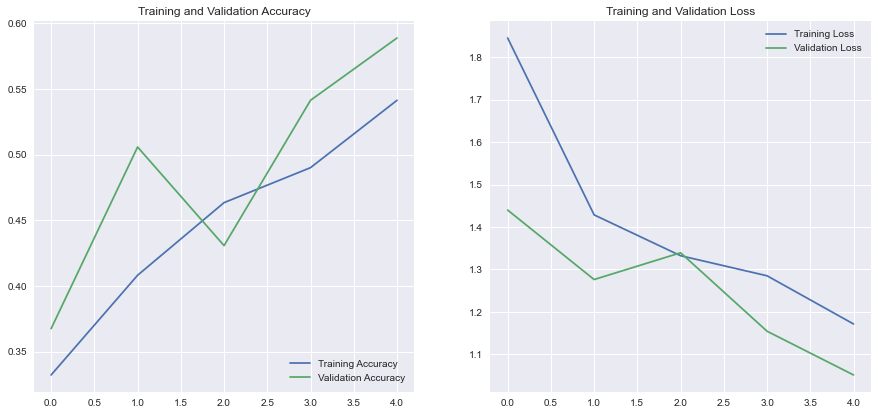

In [39]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs_range = range(epochs)
# Plotting ACCURACY
plt.figure(figsize=(15, 15))
plt.subplot(2, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')
# PLotting LOSS
plt.subplot(2, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [ ]:
#GETS PREDICTIONS INDCIES
y_predictions = np.argmax(model.predict(test_generator), axis=-1)
#GETS PREDICTIONS LABELS
y_predictions_labels = [classes[idx] for idx in y_predictions]

clsf_report = classification_report(y_test, y_predictions_labels, target_names = classes)
print(clsf_report)

## Plot confusion matrix
cm = confusion_matrix(y_test, y_predictions_labels)
fig, ax = plt.subplots(figsize=(7,5),dpi=100)
sns.heatmap(cm, annot=True, fmt='d', ax=ax, cmap=plt.cm.Blues, cbar=False)
ax.set(xticklabels=classes, yticklabels=classes, title="Confusion matrix")
plt.yticks(rotation=0);

### Transfer Learning

## Testing In the Wild